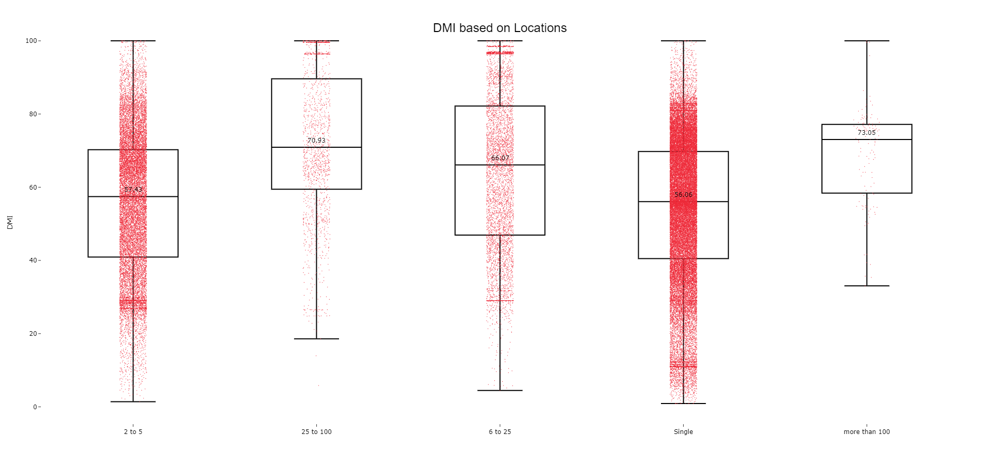

In [2]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go

# Read the data
df = pd.read_excel(r"C:\Users\naird\OneDrive - Dun and Bradstreet\Documents\Data for Charts.xlsx", sheet_name='Data')

# Cap the scores at 100
df['DMI'] = np.clip(df['DMI'], 0, 100)

# Create a DataFrame for sorting
data = pd.DataFrame({
    'Location': df['locations'],
    'DMI': df['DMI']
})

# Sort the DataFrame by Industry
data_sorted = data.sort_values(by='Location')

fig = go.Figure()

# Adding box plots with no legends
fig.add_trace(go.Box(
    y=data_sorted['DMI'], x=data_sorted['Location'], boxpoints='all', jitter=0.3, pointpos=0, name='DMI',
    marker_size=1, marker=dict(color='#ee2938'), fillcolor='#FFFFFF', line=dict(color='black'),
    showlegend=False
))

# Adding dummy scatter traces for legends


def add_median_annotations(fig, x_data, y_data, name, color):
    offset = 2  # Adjust this value to move the annotation slightly above the median
    for industry in sorted(set(x_data)):
        y_vals = [y for x, y in zip(x_data, y_data) if x == industry]
        median_val = pd.Series(y_vals).median()
        fig.add_annotation(
            x=industry,
            y=median_val + offset,
            text=f'{median_val:.2f}',
            showarrow=False,
            font=dict(color=color, weight='bold')  # Set font weight to bold
        )

add_median_annotations(fig, data_sorted['Location'], data_sorted['DMI'], 'DMI', '#000000')

# Update layout
fig.update_layout(
    title=dict(text='DMI based on Locations', font=dict(color='black', size=24, family='Arial', weight='bold'), y=0.95, x=0.5, xanchor='center', yanchor='top'),
    yaxis_title='DMI',
    boxmode='group',  # group together boxes of the different traces for each value of x
    template='ggplot2',
    plot_bgcolor='rgba(0, 0, 0, 0)',
    paper_bgcolor='rgba(0, 0, 0, 0)',
    legend=dict(font=dict(color='black')),  # Set legend text color to black
    yaxis=dict(title_font=dict(color='black'), tickfont=dict(color='black')),  # Set y-axis title and tick color to black
    xaxis=dict(tickfont=dict(color='black'), categoryorder='category ascending'),  # Arrange x-axis in ascending order
    autosize=False,
    width=1600,
    height=900,
    margin=dict(t=40)  # Adjust the top margin
)

fig.show()


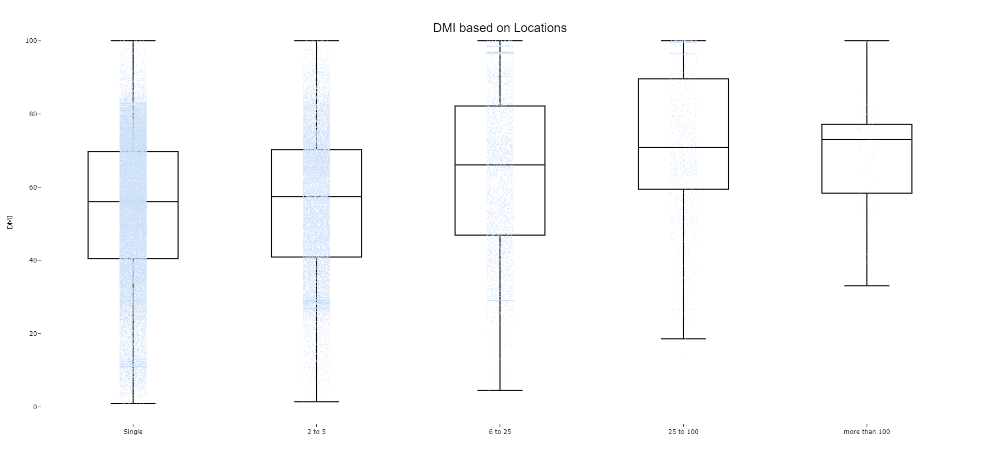

In [12]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go

# Read the data from the uploaded file
file_path =r"C:\Users\naird\OneDrive - Dun and Bradstreet\Documents\Data for Charts.xlsx"
df = pd.read_excel(file_path, sheet_name='Data')

# Cap the scores at 100
df['DMI'] = np.clip(df['DMI'], 0, 100)

# Create a DataFrame for sorting
data = pd.DataFrame({
    'Location': df['locations'],
    'DMI': df['DMI']
})

# Define the desired order for the Location column
location_order = ['Single', '2 to 5', '6 to 25', '25 to 100', 'more than 100']
data['Location'] = pd.Categorical(data['Location'], categories=location_order, ordered=True)

# Sort the DataFrame by the defined order
data_sorted = data.sort_values(by='Location')

fig = go.Figure()

# Adding box plots with no legends
fig.add_trace(go.Box(
    y=data_sorted['DMI'], x=data_sorted['Location'], boxpoints='all', jitter=0.3, pointpos=0, name='DMI',
    marker_size=1, marker=dict(color='#cadef8'), fillcolor='#FFFFFF', line=dict(color='black'),
    showlegend=False
))

# Adding median annotations
# def add_median_annotations(fig, x_data, y_data, name, color):
#     offset = 2  # Adjust this value to move the annotation slightly above the median
#     for industry in sorted(set(x_data)):
#         y_vals = [y for x, y in zip(x_data, y_data) if x == industry]
#         median_val = pd.Series(y_vals).median()
#         fig.add_annotation(
#             x=industry,
#             y=median_val + offset,
#             text=f'{median_val:.1f}',
#             showarrow=False,
#             font=dict(color=color, weight='bold')  # Removed 'weight' as it is not a valid property
#         )

# add_median_annotations(fig, data_sorted['Location'], data_sorted['DMI'], 'DMI', '#000000')

# Update layout
fig.update_layout(
    title=dict(text='DMI based on Locations', font=dict(color='black', size=24, family='Arial'), y=0.95, x=0.5, xanchor='center', yanchor='top'),
    yaxis_title='DMI',
    boxmode='group',  # group together boxes of the different traces for each value of x
    template='ggplot2',
    plot_bgcolor='rgba(0, 0, 0, 0)',
    paper_bgcolor='rgba(0, 0, 0, 0)',
    legend=dict(font=dict(color='black')),  # Set legend text color to black
    yaxis=dict(title_font=dict(color='black'), tickfont=dict(color='black')),  # Set y-axis title and tick color to black
    xaxis=dict(
        tickfont=dict(color='black'),
        categoryorder='array',
        categoryarray=location_order  # Set the x-axis categories in the desired order
    ),
    autosize=False,
    width=1600,
    height=900,
    margin=dict(t=40)  # Adjust the top margin
)